# ¿Qué es *Object Detection*?

*Object Detection* (también llamado a veces *Object Recognition*) es un término general que se usa para describir una colección de tareas de *computer vision* que implican identificar **objetos semánticos de una cierta clase** (como humanos, edificios, perros, o coches) en imágenes o videos digitales.

Mientras que la *clasificación de imágenes* implica predecir la clase de un objeto en una imagen (lo que ya hicimos en los laboratorios 1 y 2), la *localización de objetos* implica identificar la ubicación de uno o más objetos en una imagen definiendo un *bounding box* (recuadro delimitador) alrededor de su extensión. La **detección de objetos** combina estas dos tareas para localizar y clasificar uno o más objetos en una imagen, tal como muestra la siguiente imagen.

![](https://upload.wikimedia.org/wikipedia/commons/3/38/Detected-with-YOLO--Schreibtisch-mit-Objekten.jpg)

Ahora vamos a distinguir estas tres tareas de *computer vision*.

**Image Classification**: predice el tipo o clase de un objeto en una imagen.
- *Entrada*: una imagen con un solo objeto.
- *Salida*: una etiqueta de clase.

**Object Localization**: localiza la presencia de objetos en una imagen e indica su ubicación con un *bounding box*.
- *Entrada*: una imagen con uno o más objetos.
- *Salida*: una o más casillas delimitadoras (por ejemplo, definidas por un punto, ancho, y altura).

**Object Detection**: localiza la presencia de objetos con un *bounding box* y su respectiva clase.
- *Entrada*: una imagen con uno o más objetos.
- *Salida*: una o más casillas delimitadoras (definidas por un punto, ancho, y altura), y una etiqueta de clase para cada uno.

En la siguiente imagen se muestran diferentes tareas de *computer vision* y los resultados que producen.

![](https://nanonets.com/blog/content/images/size/w1000/2020/08/59b6d0529299e.png)

Ahora que ya manejamos una terminología básica vamos a pasar a ver como podemos implementar la tarea de detección de objetos con *deep learning* en la práctica, usando *Python* y *TensorFlow*.

---

**NOTA**: El notebook ha sido creado a partir de recursos disponibles en la web que se listan a continuación. La fuente de las imágenes originales se puede consultar directamente en el *markdown* insertado en la celda de texto.

- https://machinelearningmastery.com/object-recognition-with-deep-learning/
- https://en.wikipedia.org/wiki/Object_detection
- https://www.tensorflow.org/hub/tutorials/tf2_object_detection?hl=en
- https://www.tensorflow.org/lite/models/object_detection/overview?hl=en

# *Object Detection* con `TensorFlow Hub`

[TensorFlow Hub (TF Hub)](https://tfhub.dev/) es un repositorio de modelos de aprendizaje automático previamente entrenados, listos para ser optimizados e implementados donde quieras con solo unas pocas líneas de código. Para saber más de *TF Hub* pueden ir a las [guías oficiales](https://www.tensorflow.org/hub/), o chequear el siguiente [tutorial](https://medium.com/ymedialabs-innovation/how-to-use-tensorflow-hub-with-code-examples-9100edec29af).

En resumen, *TF Hub* pone a disposición una gran colección de modelos *out-of-the-box* para detección de objetos, cuyos detalles se pueden encontrar en este [link](https://tfhub.dev/s?module-type=image-object-detection). En este notebook vamos a hacer uso de estos modelos, como también funciones provistas por la [API de TF Hub](https://www.tensorflow.org/hub/api_docs/python/hub). 

En este tutorial vamos a revisar los pasos para ejecutar diferentes modelos de detección disponibles en *TF Hub* sobre imágenes del dataset [COCO 2017](https://cocodataset.org/#explore).

## Importaciones y configuraciones iniciales

Como siempre, comenzamos con las importaciones iniciales.

In [1]:
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

import keras

from PIL import Image
from six import BytesIO
from six.moves.urllib.request import urlopen

tf.get_logger().setLevel('ERROR')

print(f'TensorFlow Version: {tf.__version__}')
print(f'Keras Version: {keras.__version__}')

TensorFlow Version: 2.6.0
Keras Version: 2.6.0


## Utilidades

La siguiente celda de código crea algunas utilidades que se necesitarán más adelante:

- Cargar una imagen.
- Administrar los modelos en *TF Hub*.
- Una lista de imágenes para propósitos de testeo (se pueden agregar todas las que se quiera).
- Información extra del dataset [COCO 2017](https://cocodataset.org/#home) (necesario para modelar algunos de los modelos disponibles en *TF Hub*).

In [2]:
def load_image_into_numpy_array(path):
  """
  Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels == 3 for RGB.

  Args:
    path: the file path to the image.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3).
  """
  image = None
  if path.startswith('http'):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape((1, im_height, im_width, 3)).astype(np.uint8)


ALL_MODELS = {
'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1',
}

IMAGES_FOR_TEST = {
  'Beach' : 'models/research/object_detection/test_images/image2.jpg',
  'Dogs' : 'models/research/object_detection/test_images/image1.jpg',
  # By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
  'Naxos Taverna' : 'https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg',
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  'Beatles' : 'https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg',
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  'Phones' : 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg',
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  'Birds' : 'https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg',
}

COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
                               (0, 2),
                               (1, 3),
                               (2, 4),
                               (0, 5),
                               (0, 6),
                               (5, 7),
                               (7, 9),
                               (6, 8),
                               (8, 10),
                               (5, 6),
                               (5, 11),
                               (6, 12),
                               (11, 12),
                               (11, 13),
                               (13, 15),
                               (12, 14),
                               (14, 16)]

## Herramientas de visualización

Para visualizar los objetos detectados con las casillas delimitadoras y su segmentación, utilizaremos la *Object Detection API* de `TensorFlow`. Para instalarla, clonamos el repositorio de *GitHub*.

In [3]:
# Clone the tensorflow models repository
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2959, done.
remote: Counting objects: 100% (2959/2959), done.
remote: Compressing objects: 100% (2492/2492), done.
remote: Total 2959 (delta 753), reused 1258 (delta 427), pack-reused 0
Receiving objects: 100% (2959/2959), 33.04 MiB | 29.63 MiB/s, done.
Resolving deltas: 100% (753/753), done.


Ahora instalamos la *Object Detection API*.

In [4]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Reading package lists...
Building dependency tree...
Reading state information...
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.
Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1675218 sha256=b36236bff3618673dff6bc641c3bbb6c6d598c01501abb400bc3aa689079fcb8
  Stored in directory: /tmp/pip-ephem-wheel-cache-a001tp66/wheels/fa/a4/d2/e9a5057e414fd46c8e543d2706cd836d64e1fcd9eccceb2329
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=97638c3486162c630e27801ab8105e3ded9c437072084bab2405d41bba6d3266
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for avro-python3: filename=avro_python3-1.9.2.1-py3-none-any.whl size=43512 sha256=25dd5351609fb12a09557c51d5cf8dda0b75effee5d13403a009ca09c3f50e85
  Stored in directory: /r



  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


Importamos las librerías que vamos a necesitar en el notebook.

In [5]:
from object_detection.utils import label_map_util

from object_detection.utils import ops as utils_ops
from object_detection.utils import visualization_utils as viz_utils

%matplotlib inline

Y finalmente vamos a cargar las etiquetas del dataset. Las etiquetas (o *labels*) corresponden a números enteros que están asociados a los nombres de las categorías del dataset. De modo que cuando **CNN** predice `5`, sabemos que esto corresponde a `airplane`. Para lo cual vamos a usar algunas funciones de la *API* que nos ayudan a simplificar el código.

In [6]:
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

## Eligiendo el modelo de detección

Ahora vamos a elegir el modelo de detección de objetos que queremos utilizar. Para esto, tenemos que seleccionar la arquitectura deseada y el modelo se cargará automáticamente. Acá estamos usando los *form* del `Colab`, por lo que la lista de modelos la pueden elegir de la lista desplegable de la derecha (acá les dejo el [tutorial de Colab](https://colab.research.google.com/drive/1a6y9DN3BNA8qim-1hqCqId48hUoY44Cr) donde se introducen los formularios).

Si se quiere cambiar el modelo para probar otras arquitecturas más tarde, simplemente se elige otra y se ejecuta la celda y todas las siguientes (recordá que lo podes hacer con un solo click desde el menú `Entorno de Ejecución -> Ejecutar celda seleccionada y las siguientes`).

**NOTA**: Si deseas conocer más detalles sobre el modelo seleccionado, puedes seguir el enlace que se imprime en la salida (también disponible en la lista `ALL_MODELS`) y leer la documentación adicional en *TF Hub*.

In [7]:
#@title Model Selection
model_display_name = 'Mask R-CNN Inception ResNet V2 1024x1024' # @param ['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']
model_handle = ALL_MODELS[model_display_name]

print(f'Selected Model: {model_display_name}')
print(f'Model Handle at TensorFlow Hub: {model_handle}')

Selected Model: Mask R-CNN Inception ResNet V2 1024x1024
Model Handle at TensorFlow Hub: https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1


## Cargando el modelo seleccionado

Acá solo necesitamos el identificador del modelo que se seleccionó y usamos la biblioteca de *Tensorflow Hub* para cargarlo en la memoria. 

**Este proceso lleva algunos minutos** (les sobra para calentar el agua del mate o hacerse un café).

In [8]:
print('loading model...')
hub_model = hub.load(model_handle)
print('model loaded!')

loading model...
model loaded!


**Opcionalmente** se pueden cargar los modelos disponibles en *TF Hub* para ser usados con la librería *Keras* (tal como veníamos haciendo en los notebooks anteriores). Una ventaja de esto es que podemos visualizar la arquitectura de la red mediante la función `summary()`. Dado que la siguiente celda requiere varios minutos para ejecutarse comentamos su contenido, pero si les da curiosidad mirar de cerca la arquitectura del modelo elegido no dejen de ejecutarla (aunque seguramente requiera algo más de esfuerzo para acomodar las capas de input y output del modelo *keras*).

In [9]:
# TODO...

## Cargando una imagen de testeo

Dado que todos los modelos en la colección *TensorFlow Hub* ya han sido entrenados, podemos comenzar a clasificar nuevas imágenes sin hacer nada más. Ahora probemos el modelo en una imagen simple. Para ayudar con esto vamos a usar la lista de imágenes de prueba disponible en la primer celda de código del notebook.

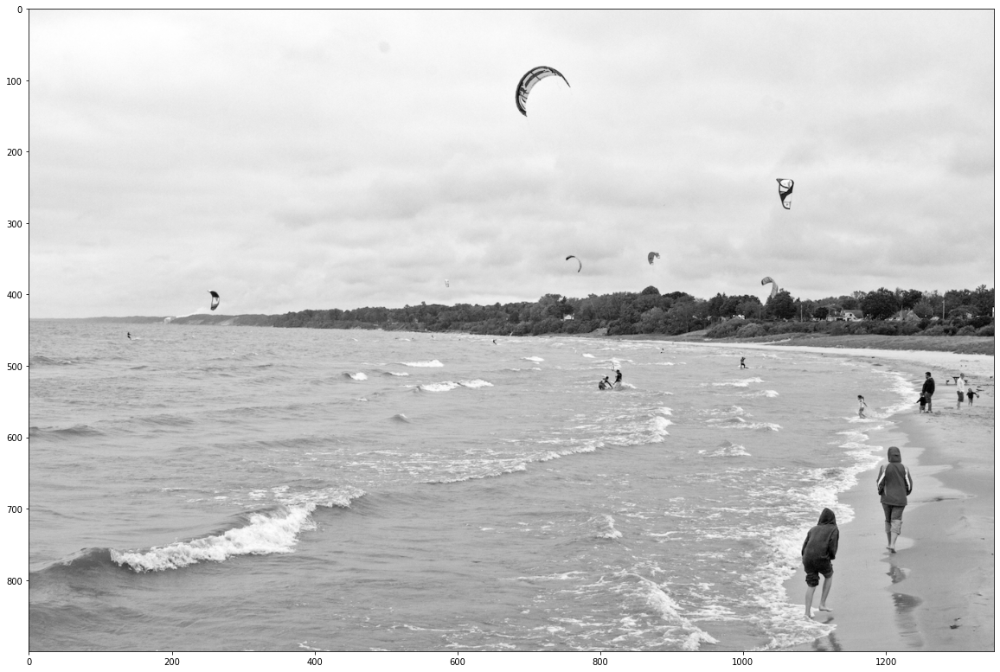

In [10]:
#@title Image Selection (¡NO TE OLVIDES DE EJECUTAR LA CELDA!)
selected_image = 'Beach' #@param ['Beach', 'Dogs', 'Naxos Taverna', 'Beatles', 'Phones', 'Birds']
flip_image_horizontally = True #@param {type:"boolean"}
convert_image_to_grayscale = True #@param {type:"boolean"}

image_path = IMAGES_FOR_TEST[selected_image]
image_np = load_image_into_numpy_array(image_path)

# Flip horizontally.
if flip_image_horizontally:
  image_np[0] = np.fliplr(image_np[0]).copy()

# Convert image to grayscale.
if convert_image_to_grayscale:
  image_np[0] = np.tile(np.mean(image_np[0], 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

plt.figure(figsize=(20, 20))
plt.imshow(image_np[0])
plt.show()

## Detectando objetos

Para hacer la inferencia solo necesitamos llamar a nuestro modelo *TF Hub* recién cargado.

In [11]:
# Running inference.
results = hub_model(image_np)

# Different object detection models have additional results.
# All of them are explained in the documentation.
result = {key: value.numpy() for key, value in results.items()}
print(result.keys())

dict_keys(['box_classifier_features', 'detection_boxes', 'num_proposals', 'raw_detection_boxes', 'rpn_box_encodings', 'detection_anchor_indices', 'anchors', 'class_predictions_with_background', 'proposal_boxes', 'mask_predictions', 'refined_box_encodings', 'detection_scores', 'rpn_features_to_crop', 'raw_detection_scores', 'final_anchors', 'num_detections', 'image_shape', 'detection_multiclass_scores', 'rpn_objectness_predictions_with_background', 'detection_masks', 'rpn_box_predictor_features', 'detection_classes', 'proposal_boxes_normalized'])


## Visualizando los resultados

Acá vamos a utilizar la *API* de detección de objetos de *TensorFlow* para mostrar las casillas delimitadoras de las detecciones.

**TIP** en la función `visualize_boxes_and_labels_on_image_array()` (linea 15) puede establecer valores diferentes para `min_score_thresh` y `max_boxes_to_draw` para permitir más o menos detecciones en la imagen de salida. La documentación completa de este método se puede ver en este [link](https://github.com/tensorflow/models/blob/master/research/object_detection/utils/visualization_utils.py).


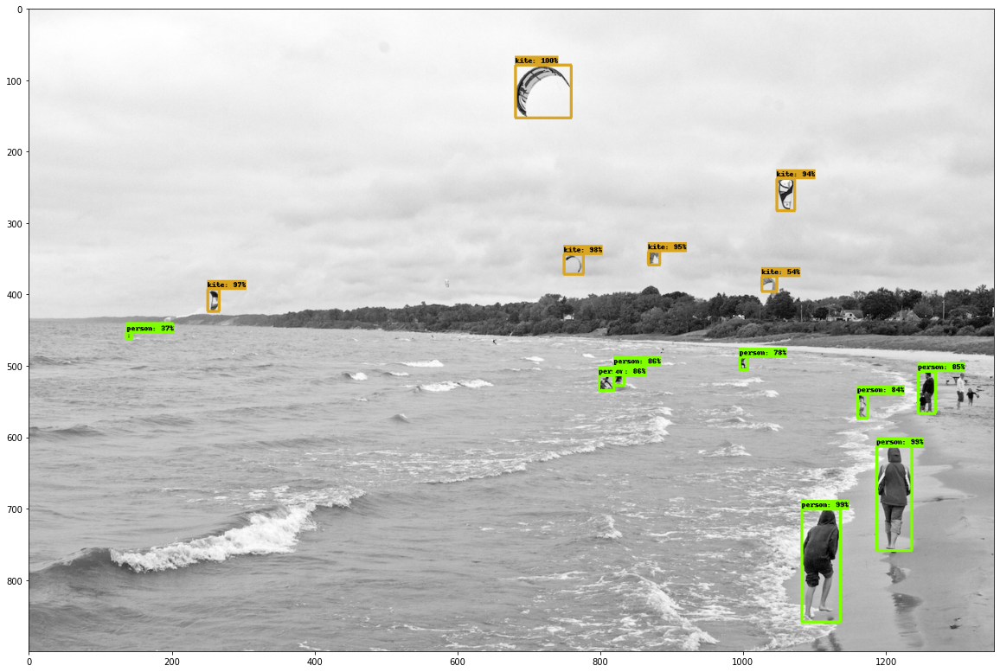

In [12]:
#@title Visualizar los resultados

label_id_offset = 0 
image_np_with_detections = image_np.copy()

max_boxes_to_draw = 100 #@param {type:"slider", min:1, max:300, step:1}
min_score_thresh = 0.3 #@param {type:"slider", min:0, max:1, step:0.01}

# Use keypoints if available in detections
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in result:
  keypoints = result['detection_keypoints'][0]
  keypoint_scores = result['detection_keypoint_scores'][0]

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=max_boxes_to_draw,
      min_score_thresh=min_score_thresh,
      agnostic_mode=False,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores,
      keypoint_edges=COCO17_HUMAN_POSE_KEYPOINTS
      )

plt.figure(figsize=(20, 20))
plt.imshow(image_np_with_detections[0])
plt.show()

---

# Trabajo Práctico 2 (primera parte)

---

## **EJERCICIO 4.1**

Ahora vamos a probar algunas variantes simples sobre el tutorial previamente desarrollado. La consigna de este ejercicio es redactar un pequeño informe (celdas de texto en este mismo notebook) sobre los resultados obtenidos.

1. **Elegir el modelo de detección**. Indague en la web sobre los algoritmos del estado de arte para detección de objetos.
 - ¿Encontrás alguno de estos algoritmos en la lista de modelos disponibles en *TF Hub*? Reportá al menos 3.
 - Seleccioná uno de los tres modelos justificando por que se eligió.
 - Volvé a ejecutar el tutorial para ese modelo.

2. **Modificar las imágenes de entrada**. Con este nuevo modelo, volvé a detectar objetos en las imágenes de testeo, pero ahora activá y desactivá los checkbox de la celda donde cargamos las imágenes de prueba. 
 - ¿Notas diferencias en los resultados de detección entre la imagen original y la transformada? Informá cuales son estas diferencias (incluso podés mostrar imágenes con los diferentes resultados).

3. **Ejecutar la detección en tus propias imágenes**. Ya comentamos que podés agregar todas las imágenes que quieras en la celda de selección de imágenes de testeo. Buscá en la web al menos 2 imágenes de cada una de las siguientes categorías: animales marinos, figuras prediseñadas (dibujos digitales en color o blanco y negro), edificios, monumentos (Pirámides, Torre Eiffel, Obelisco, etc.), montañas (sin personas, sin objetos hechos por el hombre, etc.), bosques.
 - ¿Qué tan bien funciona detectando objetos de estas categorías?
 - ¿Cuál crees que sea el problema de estos modelos para detectar estos objetos? (**TIP:** podes revisar las características del [dataset COCO 2017](https://cocodataset.org/#explore))

**Elegir el modelo de detección**

Al realizar una investigación breve por la web, descubrimos que existen una gran cantidad de modelos que se clasifican como *estado del arte* (donde quizás varios de estos han dejado de ser reconocidos como tales). Algunos de los algoritmos de estado del arte que se encuentran en *TF Hub* son...

- [Faster R-CNN](https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1)
  *Region Based Convolutional Neural Networks* es una familia de modelos diseñados específicamente para detección de objetos.
  Partiendo de **R-CNN**, dada una imagen se aplica un mecanismo para extraer *ROIs*, donde cada rectángulo puede representar los límites de un objeto en la imagen.
  Cada región es convertida en un vector de *features* y luego clasificada para determinar que tipo de objeto (si es que hay alguno) está contenido.
  Siguiendo con **Fast R-CNN**, se realiza la generación de *features* una única vez para toda la imagen (en lugar de por cada *ROI*), acelerando sustancialmente el tiempo de cómputo.
  Finalizando con **Faster R-CNN**, se integra la generación de *ROIs* a la red para la extracción de *features*, con el objetivo de acelerar aún más el funcionamiento del modelo.
  La última versión fue publicada en **2015**, donde **Ross Girshick** fue el autor principal de esta familia de modelos.

- [YOLOv5](https://tfhub.dev/neso613/lite-model/yolo-v5-tflite/tflite_model/1)
  El algoritmo *You Only Look Once*, es un modelo de estado del arte para detección de objetos en **tiempo real**, el cual hace uso de una única red neuronal convolucional para detectar objetos en imágenes.
  Para su funcionamiento, la red neuronal divide la imagen en regiones, prediciendo cuadros de identificación y probabilidades por cada región; las cajas son ponderadas a partir de las probabilidades predichas.
  El algoritmo aprende representaciones generalizables de los objetos, permitiendo un bajo error de detección para entradas nuevas, diferentes al conjunto de datos de entrenamiento.
  La última versión, a pesar de mantenerse distante a la idea original de **Joseph Redmon**, fue publicada en **2020**.

- [EfficientDet](https://tfhub.dev/tensorflow/efficientdet/d2/1)
  La idea detrás de la creación de la red surge de intentar mejorar la eficiencia computacional de modelos estado del arte a través de un estudio sistemático.
  En general, los detectores de objetos poseen tres componentes principales: un **esqueleto** que extrae *features* de una imagen; una **red de features** que toma múltiples niveles de características como entrada y produce como salida una lista de características fusionadas; una **caja de predicción** que realiza la predicción de las clases y localización de objetos.
  Analizando cada uno de estos componentes en modelos estados del arte, se realizaron múltiples optimizaciones para mejorar el desempeño y la eficiencia del modelo resultante.
  El modelo fue creado por el equipo de **Google Brain**, y el *paper* de investigación fue publicado en **2020**.

Al analizar los resultados de las investigaciones publicadas por cada uno de los autores, decidimos continuar el laboratorio con **EfficientDet** ya que parece obtener los mejores resultados (entre los tres modelos), y ser un punto intermedio en términos de eficiencia (siendo **YOLO** el mejor, y **R-CNN** el peor).

In [13]:
model_display_name = 'efficientdet/d7'
model_handle = 'https://tfhub.dev/tensorflow/efficientdet/d7/1'

print(f'Selected Model: {model_display_name}')
print(f'Model Handle at TensorFlow Hub: {model_handle}')

Selected Model: efficientdet/d7
Model Handle at TensorFlow Hub: https://tfhub.dev/tensorflow/efficientdet/d7/1


In [14]:
print('loading model...')
hub_model = hub.load(model_handle)
print('model loaded!')

loading model...


model loaded!


In [15]:
# Running inference.
results = hub_model(image_np)

# Different object detection models have additional results.
# All of them are explained in the documentation.
result = {key: value.numpy() for key, value in results.items()}
print(result.keys())

dict_keys(['detection_boxes', 'raw_detection_boxes', 'num_detections', 'detection_multiclass_scores', 'raw_detection_scores', 'detection_scores', 'detection_anchor_indices', 'detection_classes'])


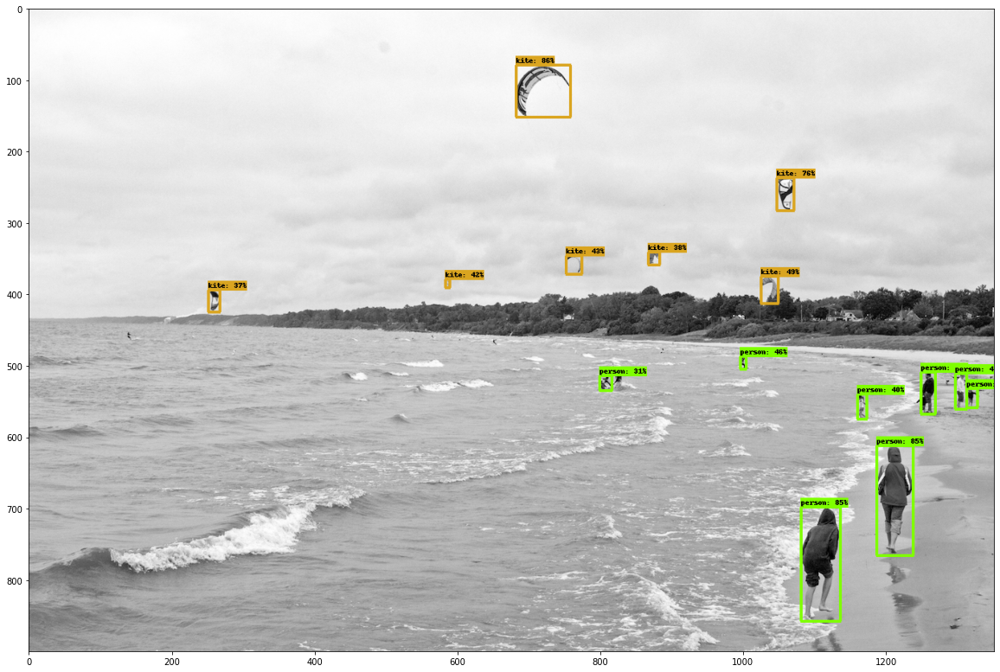

In [16]:
image_np_with_detections = image_np.copy()

# Mantenemos los parámetros para facilitar la comparación entre resultados.
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=max_boxes_to_draw,
      min_score_thresh=min_score_thresh
      )

plt.figure(figsize=(20, 20))
plt.imshow(image_np_with_detections[0])
plt.show()

**Observación**

Es posible notar algunas diferencias al comparar los resultados de la detección de **EfficientDet** con los obtenidos por **Mask R-CNN**.
- En el caso de los *kites*, el modelo elegido encuentra uno más (en el centro de la imagen) que el modelo propuesto en el laboratorio.
  A pesar del tamaño reducido de los elementos, el modelo de *Google* parece detectar todos los objetos de esta categoría en la imagen.
- En el caso de las *persons*, hay una especie de empate en la detección.
  Mientras que el modelo elegido encuentra dos personas (a la derecha de la imagen) que el modelo propuesto no detecta; no reconoce a otras dos personas (a la izquierda y el centro de la imagen) que el modelo basado en regiones si detecta.

**Modificar las imágenes de entrada**

Con una imagen de testeo arbitraria, aplicaremos todas las combinaciones de transformaciones disponibles y realizaremos la detección de objetos para cada una.
Concluiremos analizando los resultados obtenidos en la experimentación.

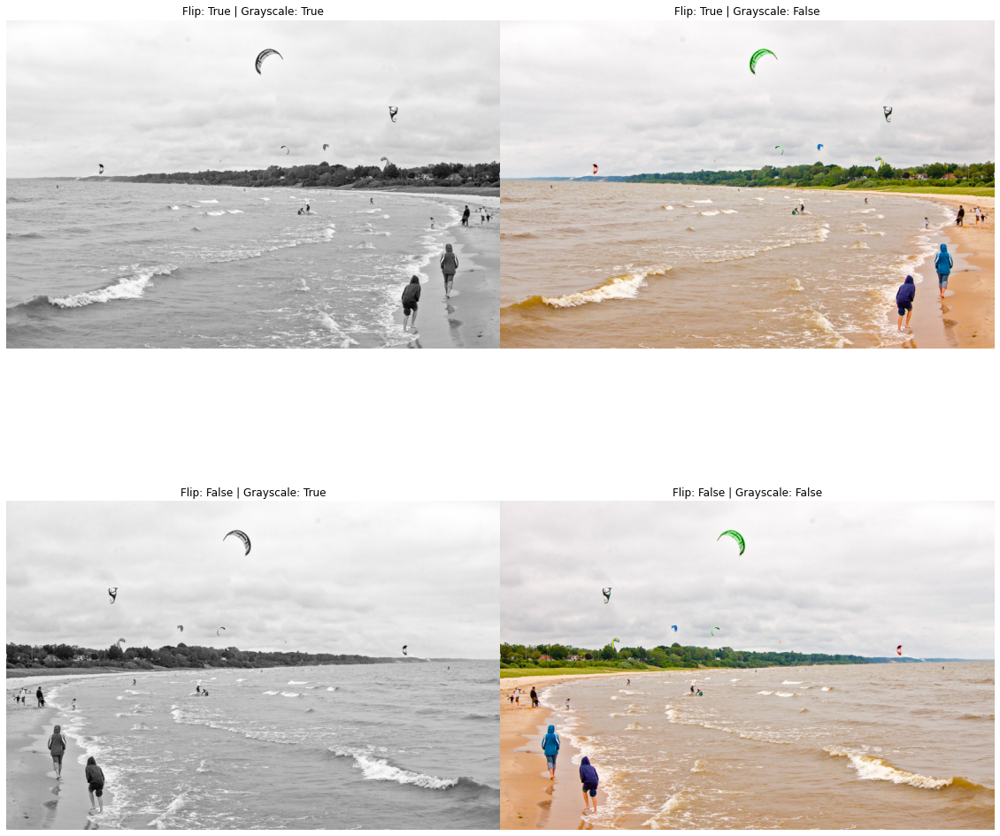

In [17]:
images_NP = []
bool_Flags = [(True, True),
              (True, False),
              (False, True),
              (False, False)]

figure, axes = plt.subplots(2, 2, figsize=(20, 20))

for i, (flip_horizontally, convert_to_grayscale) in enumerate(bool_Flags):
  # Load image.
  image_np = load_image_into_numpy_array(image_path)

  # Flip horizontally.
  if flip_horizontally:
    image_np[0] = np.fliplr(image_np[0]).copy()

  # Convert to grayscale.
  if convert_to_grayscale:
    image_np[0] = np.tile(np.mean(image_np[0], 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

  # Save image.
  images_NP.append((image_np, flip_horizontally, convert_to_grayscale))

  # Plot image.
  plt.subplot(2, 2, i + 1)
  plt.title(f'Flip: {flip_horizontally} | Grayscale: {convert_to_grayscale}')
  plt.axis('off')
  plt.imshow(image_np[0])

plt.subplots_adjust(wspace=0, hspace=0)

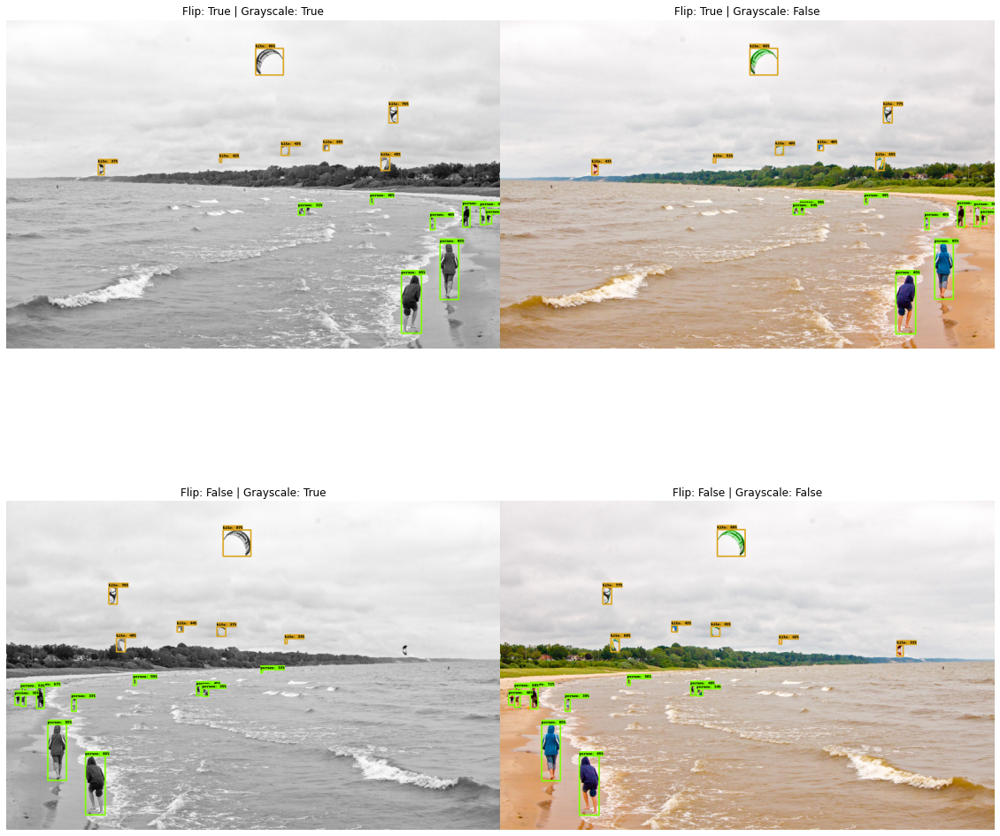

In [18]:
figure, axes = plt.subplots(2, 2, figsize=(20, 20))

for i, (image_np, flip_horizontally, convert_to_grayscale) in enumerate(images_NP):
  # Running inference.
  results = hub_model(image_np)
  # Different object detection models have additional results.
  result = {key: value.numpy() for key, value in results.items()}

  image_np_with_detections = image_np.copy()

  # Visualization of the object detection results.
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=max_boxes_to_draw,
      min_score_thresh=min_score_thresh
      )

  # Plot image.
  plt.subplot(2, 2, i + 1)
  plt.title(f'Flip: {flip_horizontally} | Grayscale: {convert_to_grayscale}')
  plt.axis('off')
  plt.imshow(image_np_with_detections[0])

plt.subplots_adjust(wspace=0, hspace=0)

**Observación**

Como una conclusión general (y para nada definitiva) se podría decir que se consiguen los mejores resultados con imágenes **a color**, donde puede que los contrastes de las vestimentas de las personas ayuden a la detección.
En cambio, al **voltear** la imagen solo logramos que algunos objetos sean (o no) reconocidos en las imágenes en *escala de grises*.

> `Flip = True` **&** `Grayscale = True`

Ya habíamos analizado los resultados de la detección de objetos en esta situación.
Se detectan todos los *kites*, pero no se reconocen varias de las *persons*.
Un par es bastante evidente, pero el resto se podría considerar como imperceptible para la visión de una persona.

> `Flip = True` **&** `Grayscale = False`

Al parecer se detecta una persona (evidente) adicional que en la escala de grises no era reconocida.

> `Flip = False` **&** `Grayscale = True`

Se detecta otra persona más (imperceptible), pero perdemos uno de los elementos para hacer *wind surf*.

> `Flip = False` **&** `Grayscale = False`

En esta instancia se obtienen resultados similares a los conseguidos con la otra versión a color de la imagen.

**Ejecutar la detección en tus propias imágenes**

En esta instancia de la experimentación intentaremos detectar objetos en **6** nuevos contextos o categorías.

- Animales marinos.
- Figuras prediseñadas (dibujos digitales).
- Edificios.
- Monumentos (Pirámides, Torre Eiffel, Obelisco, etc.).
- Montañas (sin personas, sin objetos hechos por el hombre, etc.).
- Bosques.

In [19]:
NEW_IMAGES_FOR_TEST = {
  'Fishes_1': 'https://upload.wikimedia.org/wikipedia/commons/a/a1/Male_whale_shark_at_Georgia_Aquarium.jpg',
  'Fishes_2': 'https://upload.wikimedia.org/wikipedia/commons/7/76/Finding_Nemo_%282155740832%29.jpg',
  'Figures_1': 'https://upload.wikimedia.org/wikipedia/commons/5/52/Geometric_Shapes_%2824642831483%29.jpg',
  'Figures_2': 'https://upload.wikimedia.org/wikipedia/commons/b/b2/Stars_and_Geometric_Shapes_in_Granada.jpg',
  'Buildings_1': 'https://upload.wikimedia.org/wikipedia/commons/6/60/Statsbiblioteket_l%C3%A6sesalen-2.jpg',
  'Buildings_2': 'https://upload.wikimedia.org/wikipedia/commons/d/d2/Tomb_of_Humayun%2C_Delhi.jpg',
  'Monuments_1': 'https://upload.wikimedia.org/wikipedia/commons/d/de/Eiffel_Tower_and_Pont_Alexandre_III_at_night.jpg',
  'Monuments_2': 'https://upload.wikimedia.org/wikipedia/commons/5/54/Obelisco_Buenos_Aires_Argentina.jpg',
  'Mountains_1': 'https://upload.wikimedia.org/wikipedia/commons/9/90/Trebinje_River.jpg',
  'Mountains_2': 'https://upload.wikimedia.org/wikipedia/commons/7/78/Glarus_Kloentalersee.jpg',
  'Forests_1': 'https://upload.wikimedia.org/wikipedia/commons/9/9a/Camp_-_West_Virginia_-_ForestWander.jpg',
  'Forests_2': 'https://upload.wikimedia.org/wikipedia/commons/f/f3/Vaade_Meenikunno_rabale_Liipsaare_vaatetornist.jpg'
}

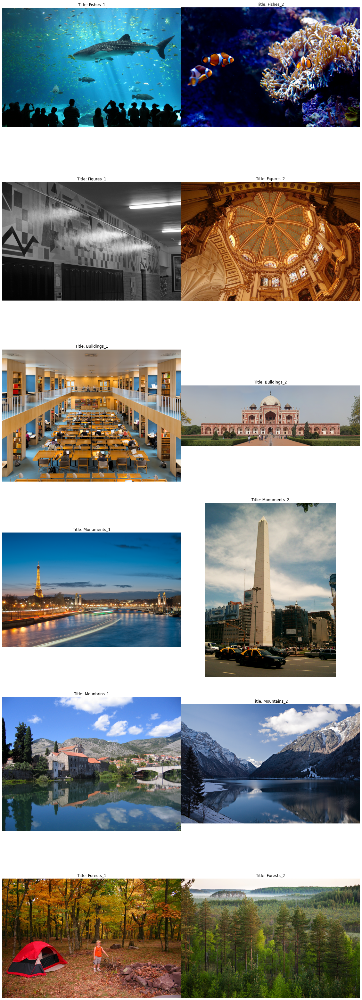

In [20]:
images_NP = []

figure, axes = plt.subplots(6, 2, figsize=(20, 60))

for i, (image_title, image_path) in enumerate(NEW_IMAGES_FOR_TEST.items()):
  # Load image.
  image_np = load_image_into_numpy_array(image_path)

  # Save image.
  images_NP.append((image_title, image_np))

  # Plot image.
  plt.subplot(6, 2, i + 1)
  plt.title(f'Title: {image_title}')
  plt.axis('off')
  plt.imshow(image_np[0])

plt.subplots_adjust(wspace=0, hspace=0)

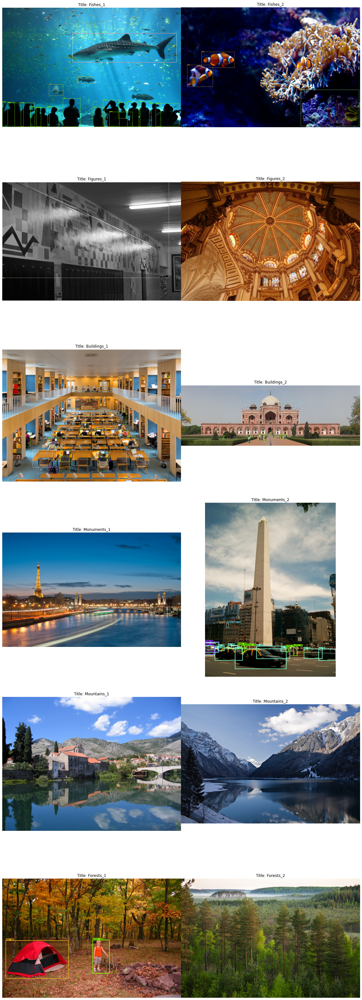

In [21]:
figure, axes = plt.subplots(6, 2, figsize=(20, 60))

for i, (image_title, image_np) in enumerate(images_NP):
  # Running inference.
  results = hub_model(image_np)
  # Different object detection models have additional results.
  result = {key: value.numpy() for key, value in results.items()}

  image_np_with_detections = image_np.copy()

  # Visualization of the object detection results.
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=max_boxes_to_draw,
      min_score_thresh=min_score_thresh
      )

  # Plot image.
  plt.subplot(6, 2, i + 1)
  plt.title(f'Title: {image_title}')
  plt.axis('off')
  plt.imshow(image_np_with_detections[0])

plt.subplots_adjust(wspace=0, hspace=0)

**Observaciones**

Es evidente que nuestro modelo elegido tiene un comportamiento inusual frente a este tipo de imágenes.
Si analizamos las clases de objetos del dataset *COCO 2017* nos damos cuenta que ninguna de las categorías o configuraciones aparece en el conjunto de datos, lo cual significa que nuestro modelo **NO** está preparado para esta tarea.

> `Fishes`

Encontramos a las personas correctamente, pero al no haber animales marinos en el dataset, la red parece asignarles clases incorrectas.

> `Figures`

No hay nada detectable en estas imágenes.
Al parecer el modelo detecta erróneamente algo en la pared.

> `Buildings`

Detectamos a las mayorías de las personas, algunas mochilas, y algunos escritorios.

> `Monuments`

Reconocemos algunos botes, vehículos, semáforos, y camiones.
En esta categoría conseguimos uno de los mejores desempeños.

> `Mountains`

Detectamos el bote y nada más.
No hay demasiado para reconocer.

> `Bosques`

Detectamos a la persona, y reconocemos erróneamente a un *barrilete* (lo cual resulta lógico ya que visualmente son similares).

## **EJERCICIO 4.2** (Opcional)

Entre los modelos de detección de objetos disponibles se encuentra *Mask R-CNN*. Lo interesante de este modelo es que permite obtener como resultado la máscara de segmentación de instancias.

**CUIDADO**: antes de continuar tenes que ir a la celda de selección de modelos, elegir *Mask R-CNN* y volver a ejecutar esa celda y todas las siguientes (CTRL+F10 desde la celda de selección de modelos)

Para visualizarlo usaremos el mismo método que usamos antes pero agregando un parámetro adicional: `instance_masks=output_dict.get('detection_masks_reframed', None)`



In [ ]:
max_boxes_to_draw=200 #@param {type:"slider", min:1, max:300, step:1}
min_score_thresh=0.3 #@param {type:"slider", min:0, max:1, step:0.01}

# Handle models with masks:
image_np_with_mask = image_np.copy()

if 'detection_masks' in result:
  # we need to convert np.arrays to tensors
  detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
  detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])

  # Reframe the the bbox mask to the image size.
  detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes,
              image_np.shape[1], image_np.shape[2])
  detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                      tf.uint8)
  result['detection_masks_reframed'] = detection_masks_reframed.numpy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_mask[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=max_boxes_to_draw,
      min_score_thresh=min_score_thresh,
      agnostic_mode=False,
      instance_masks=result.get('detection_masks_reframed', None),
      line_thickness=8)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_mask[0])
plt.show()

Ahora vamos a visualizar solamente la máscara. Para esto, tenemos que indicar en `detection_masks_reframed` el índice que corresponde a la máscara del objeto que queremos mostrar.

In [ ]:
plt.figure(figsize=(24,32))
plt.imshow(detection_masks_reframed[0])
plt.show()

Con todo esto, ahora tenemos los primeros elementos para poder evaluar que tan bien funciona el detector de objetos sobre una imagen en particular. Para esto deben indagar sobre las medidas de rendimiento típicamente utilizadas en la detección de objetos (TIP: buscar IoU y Dice). En la web existen muchos ejemplos de como utilizar estas medidas, incluso hay código disponible. 

A grandes rasgos, la idea de estas medidas es realizar una comparación de la máscara producida por el algoritmo (generalmente nombrada **prediction**) con una máscara hecha a mano (generalmente llamada **groundtruth**). Por lo tanto, el groundtruth es una imagen similar a la que se muestra arriba, pero donde la segmentación la hace una persona. A continuación se deja un ejemplo más concreto, donde se suporpone la imagen original con el groundtruth (izquierda) y la predicción del algoritmo (derecha).

![](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)

El dataset COCO 2017 ofrece máscaras para muchas de sus imágenes.

Por lo tanto, la consigna de este ejercicio es la siguiente:

1. Evalue el rendimiento del modelo sobre un conjunto de imágenes de prueba (TIP: indague métricas para instance segmentation y reutilice código disponible en la web)

2. Reporte los resultados obtenidos